# An Analysis of Austin, Texas Using Data Science to Determine a Location for a New Business. (IBM Data Science Certification Capstone)

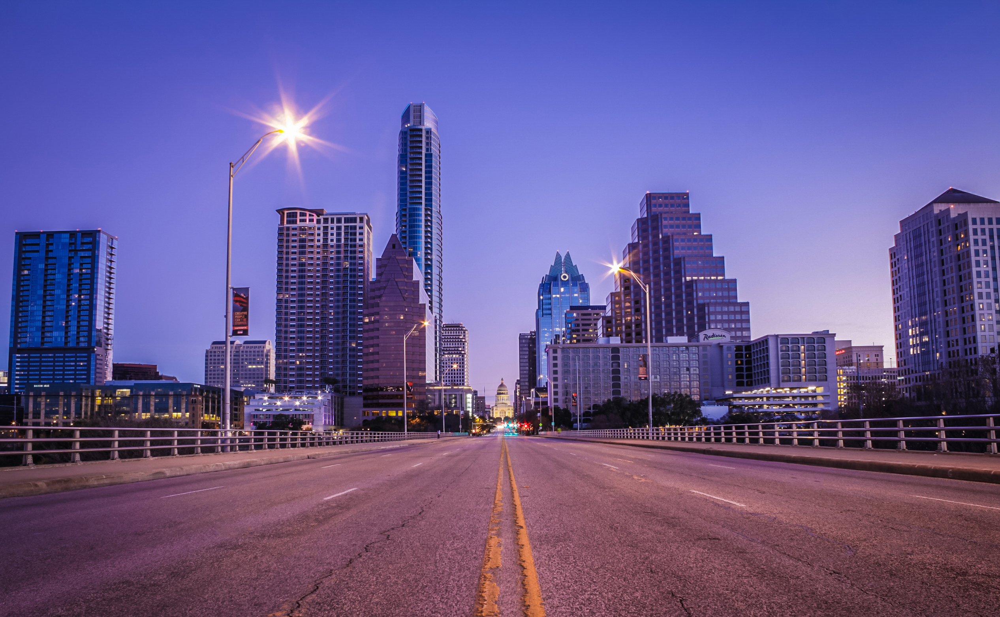

## Introduction

The city of Austin, Texas, is one of the fastest-growing cities in the United States in the number of people moving there each year. In 2018, the population of Austin grew by 2.5%, with an estimated 100 people moving to the Austin metro area each day. It is home to the University of Texas and a growing technology industry. It is also growing in affluence, median income increased 9.35% over the past three years compared to the national average of 5.60%. Putting these factors together, Austin seems to offer a fertile opportunity for new business.

Even before Austin became a “go-to destination” for relocation, it was well known for its nightlife and its live music scene earning it the nickname of “Live Music Capital of the World.” Surprisingly, a preliminary examination of venues in Austin shows a less number of Indian Restaurant, defined as a place that combines the authentic indain traditional service of food and drink. Given that Indian cuisine has influenced many of the food gournets with that of growing popularity of Indian vegan foods an traditional Indian Restaurant could strike a balance in being both something different and yet familiar with broad appeal.
Given my love for Indian and Chinese cuisine, this project will be targeted for stakeholders interested in opening an Indian, Asian, or Chinese restaurant in Dallas.

The question, of course, is where the ideal location is to put open such a business and using data science analysis, this project attempts to answer this question. As part of this analysis in addition to looking at the characteristics of a neighborhood as defined by existing venues, we will come up with a “Scoring Matrix” that rates each neighborhood on certain key features that the owner of a Pub would find desirable.

##  Data acquisition

The data required for this project has been collected from multiple sources. 

In [4]:
# importing the necessary libraries
import pandas as pd
import os
import re
import matplotlib.pyplot as plt
import folium
from geopy.geocoders import Nominatim
import geocoder
import requests
from pandas.io.json import json_normalize
import json
import seaborn as sns

### Austin Neighborhoods via Wikipedia

https://en.wikipedia.org/wiki/List_of_Austin_neighborhoods
    
The Wikipedia site shown above provided almost all the information about the neighbourhoods. It included the postal code, borough and the name of the neighbourhoods present in Toronto. Since the data is not in a format that is suitable for analysis, scraping of the data was done from this site

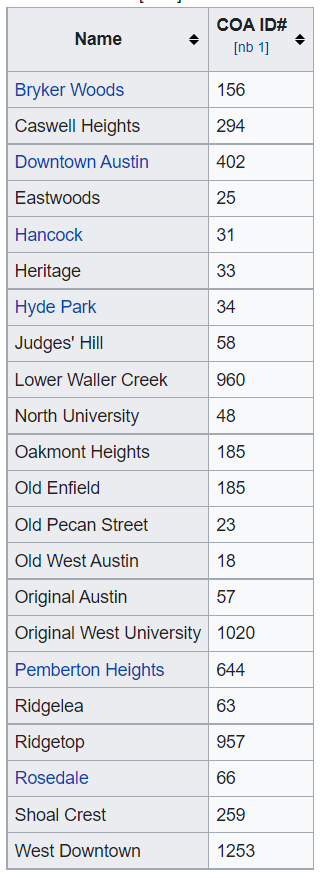

After scraping the data is stored in a CSV file.

In [3]:
# checking the directory for necessary files

print (os.listdir('C:/Users/Authorized User1/Desktop/DATA/Project/recommender system/restaurants recommendation/Neighbourhoods'))

['.ipynb_checkpoints', 'central_austin.csv', 'central_austin.ipynb', 'east_austin.csv', 'east_austin.ipynb', 'neighbourhood_with_coordinates.csv', 'North austin.ipynb', 'Northeast Austin.ipynb', 'northeast_austin.csv', 'Northwest Austin.ipynb', 'northwest_austin.csv', 'north_austin.csv', 'southeast_austin.csv', 'southeast_austin.ipynb', 'southwest_austin.csv', 'southwest_austin.ipynb', 'south_austin.csv', 'south_austin.ipynb', 'west_austin.csv', 'west_austin.ipynb']


In [3]:
# reading all the neighborhoods data
central_austin = pd.read_csv('C:/Users/Authorized User1/Desktop/DATA/Project/recommender system/restaurants recommendation/Neighbourhoods/central_austin.csv',index_col = 0)
east_austin = pd.read_csv('C:/Users/Authorized User1/Desktop/DATA/Project/recommender system/restaurants recommendation/Neighbourhoods/east_austin.csv',index_col = 0)
northeast_austin = pd.read_csv('C:/Users/Authorized User1/Desktop/DATA/Project/recommender system/restaurants recommendation/Neighbourhoods/northeast_austin.csv',index_col = 0)
northwest_austin = pd.read_csv('C:/Users/Authorized User1/Desktop/DATA/Project/recommender system/restaurants recommendation/Neighbourhoods/northwest_austin.csv',index_col = 0)
north_austin = pd.read_csv('C:/Users/Authorized User1/Desktop/DATA/Project/recommender system/restaurants recommendation/Neighbourhoods/north_austin.csv',index_col = 0)
southeast_austin = pd.read_csv('C:/Users/Authorized User1/Desktop/DATA/Project/recommender system/restaurants recommendation/Neighbourhoods/southeast_austin.csv',index_col = 0)
southwest_austin = pd.read_csv('C:/Users/Authorized User1/Desktop/DATA/Project/recommender system/restaurants recommendation/Neighbourhoods/southwest_austin.csv',index_col = 0)
south_austin = pd.read_csv('C:/Users/Authorized User1/Desktop/DATA/Project/recommender system/restaurants recommendation/Neighbourhoods/south_austin.csv',index_col = 0)
west_austin = pd.read_csv('C:/Users/Authorized User1/Desktop/DATA/Project/recommender system/restaurants recommendation/Neighbourhoods/west_austin.csv',index_col = 0)

In [4]:
# checking the neighborhoods
central_austin

,neighbourhood,area
0,1. Old West Austin,"Central Austin, Austin, Texas"
1,2. Old Enfield,"Central Austin, Austin, Texas"
2,3. Windsor Road,"Central Austin, Austin, Texas"
3,4. Bryker Woods,"Central Austin, Austin, Texas"
4,5. Rosedale,"Central Austin, Austin, Texas"
5,6. Triangle State,"Central Austin, Austin, Texas"
6,7. Hyde Park,"Central Austin, Austin, Texas"
7,8. Hancock,"Central Austin, Austin, Texas"
8,9. University of Texas,"Central Austin, Austin, Texas"
9,10. Downtown,"Central Austin, Austin, Texas"


In [5]:
# checking the neighborhoods
east_austin

,neighbourhood,area
0,1. East Cesar Chavez,"East Austin, Austin, Texas"
1,2. Holly,"East Austin, Austin, Texas"
2,3. Govalle,"East Austin, Austin, Texas"
3,4. Johnston Terrace,"East Austin, Austin, Texas"
4,5. Martin Luther King,"East Austin, Austin, Texas"
5,6. Rosewood,"East Austin, Austin, Texas"
6,7. Chestnut,"East Austin, Austin, Texas"
7,8. Central East Austin,"East Austin, Austin, Texas"
8,9. Upper Boggy Creek,"East Austin, Austin, Texas"
9,10. Mueller,"East Austin, Austin, Texas"


In [6]:
# checking the neighborhoods
northeast_austin

,neighbourhood,area
0,1. Windsor Park,"Northeast Austin, Austin, Texas"
1,2. Pecan Springs-Springdale,"Northeast Austin, Austin, Texas"
2,3. University Hills,"Northeast Austin, Austin, Texas"
3,4. Coronado Hills,"Northeast Austin, Austin, Texas"
4,5. St. Johns,"Northeast Austin, Austin, Texas"
5,6. Heritage Hills,"Northeast Austin, Austin, Texas"
6,7. Windsor Hills,"Northeast Austin, Austin, Texas"
7,8. Copperfield,"Northeast Austin, Austin, Texas"


In [7]:
# checking the neighborhoods
northwest_austin

,neighbourhood,area
0,1. Grandview Hills,"Northwest Austin, Austin, Texas"
1,2. Canyon Creek,"Northwest Austin, Austin, Texas"
2,3. Anderson Mill,"Northwest Austin, Austin, Texas"
3,4. Great Hills,"Northwest Austin, Austin, Texas"
4,5. Balcones Woods,"Northwest Austin, Austin, Texas"
5,6. Angus Valley,"Northwest Austin, Austin, Texas"
6,7. Avery Ranch,"Northwest Austin, Austin, Texas"


In [8]:
# checking the neighborhoods
north_austin

,neighbourhood,area
0,1. Allandale,"North Austin, Austin, Texas"
1,2. Brentwood,"North Austin, Austin, Texas"
2,3. North Loop,"North Austin, Austin, Texas"
3,4. Highland,"North Austin, Austin, Texas"
4,5. Crestview,"North Austin, Austin, Texas"
5,6. North Shoal Creek,"North Austin, Austin, Texas"
6,7. Wooten,"North Austin, Austin, Texas"
7,8. North Burnet,"North Austin, Austin, Texas"
8,9. North Austin Civic Association,"North Austin, Austin, Texas"
9,10. Georgian Acres,"North Austin, Austin, Texas"


In [9]:
# checking the neighborhoods
southeast_austin

,neighbourhood,area
0,1. Riverside,"Southeast Austin, Austin, Texas"
1,2. Pleasant Valley,"Southeast Austin, Austin, Texas"
2,3. Montopolis,"Southeast Austin, Austin, Texas"
3,4. Parker Lane,"Southeast Austin, Austin, Texas"
4,5. McKinney,"Southeast Austin, Austin, Texas"
5,6. Franklin Park,"Southeast Austin, Austin, Texas"


In [10]:
# checking the neighborhoods
southwest_austin

,neighbourhood,area
0,1. West Oak Hill,"Southwest Austin, Austin, Texas"
1,2. Circle C Ranch,"Southwest Austin, Austin, Texas"
2,3. Belterra,"Southwest Austin, Austin, Texas"
3,4. Highpointe,"Southwest Austin, Austin, Texas"


In [11]:
# checking the neighborhoods
south_austin

,neighbourhood,area
0,1. Barton Hills,"South Austin, Austin, Texas"
1,2. Zilker,"South Austin, Austin, Texas"
2,3. Bouldin Creek,"South Austin, Austin, Texas"
3,4. South Congress,"South Austin, Austin, Texas"
4,5. Travis Heights,"South Austin, Austin, Texas"
5,6. St. Edwards,"South Austin, Austin, Texas"
6,7. Dawson,"South Austin, Austin, Texas"
7,8. Galindo,"South Austin, Austin, Texas"
8,9. South Lamar,"South Austin, Austin, Texas"
9,10. Westgate,"South Austin, Austin, Texas"


In [12]:
# checking the neighborhoods
west_austin

,neighbourhood,area
0,1. Northwest Hills,"West Austin, Austin, Texas"
1,2. Cat Mountain,"West Austin, Austin, Texas"
2,3. Westview on Lake Austin,"West Austin, Austin, Texas"
3,4. Highland Park West Balcones,"West Austin, Austin, Texas"
4,5. Tarrytown,"West Austin, Austin, Texas"
5,6. Rollingwood,"West Austin, Austin, Texas"
6,7. West Lake Hills,"West Austin, Austin, Texas"
7,8. East Oak Hill,"West Austin, Austin, Texas"
8,9. Barton Creek,"West Austin, Austin, Texas"
9,10. Lost Creek,"West Austin, Austin, Texas"


In [13]:
# creating the empty dataframe
df = pd.DataFrame()

# appending all the dataframe in to single dataframe.
df = df.append([central_austin,east_austin,northeast_austin,northwest_austin,north_austin,southeast_austin,southwest_austin,south_austin,west_austin],ignore_index=True)

In [14]:
# checking the head
df

,neighbourhood,area
0,1. Old West Austin,"Central Austin, Austin, Texas"
1,2. Old Enfield,"Central Austin, Austin, Texas"
2,3. Windsor Road,"Central Austin, Austin, Texas"
3,4. Bryker Woods,"Central Austin, Austin, Texas"
4,5. Rosedale,"Central Austin, Austin, Texas"
...,...,...
90,16. Lakeway,"West Austin, Austin, Texas"
91,17. Hudson Bend,"West Austin, Austin, Texas"
92,18. River Place,"West Austin, Austin, Texas"
93,19. Comanche Trail,"West Austin, Austin, Texas"


In [15]:
# creating an column with a string to search in the geocoder to get the latitude and longitude

def charFilter(myString):
    return re.sub('[^A-Z]+', ' ', myString, 0, re.I)

# applying the function on dataframe column 
df['neighbourhood'] = df['neighbourhood'].apply(charFilter)

In [16]:
df["to_search"] = df['neighbourhood'] + ', ' + df['area']

In [17]:
df

,neighbourhood,area,to_search
0,Old West Austin,"Central Austin, Austin, Texas","Old West Austin, Central Austin, Austin, Texas"
1,Old Enfield,"Central Austin, Austin, Texas","Old Enfield, Central Austin, Austin, Texas"
2,Windsor Road,"Central Austin, Austin, Texas","Windsor Road, Central Austin, Austin, Texas"
3,Bryker Woods,"Central Austin, Austin, Texas","Bryker Woods, Central Austin, Austin, Texas"
4,Rosedale,"Central Austin, Austin, Texas","Rosedale, Central Austin, Austin, Texas"
...,...,...,...
90,Lakeway,"West Austin, Austin, Texas","Lakeway, West Austin, Austin, Texas"
91,Hudson Bend,"West Austin, Austin, Texas","Hudson Bend, West Austin, Austin, Texas"
92,River Place,"West Austin, Austin, Texas","River Place, West Austin, Austin, Texas"
93,Comanche Trail,"West Austin, Austin, Texas","Comanche Trail, West Austin, Austin, Texas"


In [18]:
# number unique of Main neighborhoods with their counts of sub neighborhood accoring to the areas.
df['area'].value_counts()

West Austin, Austin, Texas         20
South Austin, Austin, Texas        17
North Austin, Austin, Texas        13
Central Austin, Austin, Texas      10
East Austin, Austin, Texas         10
Northeast Austin, Austin, Texas     8
Northwest Austin, Austin, Texas     7
Southeast Austin, Austin, Texas     6
Southwest Austin, Austin, Texas     4
Name: area, dtype: int64

### Geographical Location data using Geocoder Package

eocoding is the computational process of transforming a physical address description to a location on the Earth’s surface  (Latitude and Longitude) which is a (spatial representation in numerical coordinates)

In [19]:
# initialize Nominatim API 
geolocator = Nominatim(user_agent="geoapiExercises")

def get_latlng(place):

    lat_lng_coords = None
    # loop until you get the coordinates
    while(lat_lng_coords is None):
        g = geocoder.arcgis('{}'.format(place))
        lat_lng_coords = g.latlng
    return lat_lng_coords

In [20]:
# checking the latitude and longitude
get_latlng(geocoder.arcgis('{}'.format('Bryker Woods, Central Austin, Austin, Texas')))

[30.271487937675026, -97.75152778881679]

In [21]:
# applying for loop to create a list of latitude and longitude for the Austin neighbourhoods
l = []
for i in df['to_search']:
    l.append(geocoder.arcgis('{}'.format(i)).latlng)

Status code Unknown from https://geocode.arcgis.com/arcgis/rest/services/World/GeocodeServer/find: ERROR - HTTPSConnectionPool(host='geocode.arcgis.com', port=443): Read timed out. (read timeout=5.0)


In [22]:
l

[[30.3521319479468, -97.75130429718628],
 [30.28009551561624, -97.753478976502],
 [30.292418637067534, -97.76043452479759],
 [30.271487937675026, -97.75152778881679],
 [30.3136507144892, -97.74386072851614],
 [30.31397000000004, -97.73244999999997],
 [30.177108015979186, -97.79929418205563],
 [30.3243311542761, -97.74284976764478],
 [30.278720000000078, -97.73244999999997],
 [30.27147000000008, -97.72550999999999],
 [30.259926241332483, -97.73725888133822],
 [30.25451452855716, -97.7291602351192],
 [30.26543836959941, -97.70056021851352],
 [30.279087196866215, -97.77164538244193],
 [30.28376746023669, -97.65571177949727],
 [30.270933623886165, -97.71155420491127],
 [30.374625041324002, -97.78683490482477],
 [30.27147000000008, -97.72550999999999],
 [30.185939758279353, -97.77065421605344],
 [30.30468586641024, -97.7035839051976],
 [30.292418637067534, -97.76043452479759],
 [30.43480314306512, -97.76398117235208],
 [30.287671340682383, -97.73886400423063],
 [30.326334001844906, -97.6863

In [23]:
# creating a column and appending it to the dataframe
df['Latitude_Longitude'] = l

In [24]:
# printing the resulting dataframe
df

,neighbourhood,area,to_search,Latitude_Longitude
0,Old West Austin,"Central Austin, Austin, Texas","Old West Austin, Central Austin, Austin, Texas","[30.3521319479468, -97.75130429718628]"
1,Old Enfield,"Central Austin, Austin, Texas","Old Enfield, Central Austin, Austin, Texas","[30.28009551561624, -97.753478976502]"
2,Windsor Road,"Central Austin, Austin, Texas","Windsor Road, Central Austin, Austin, Texas","[30.292418637067534, -97.76043452479759]"
3,Bryker Woods,"Central Austin, Austin, Texas","Bryker Woods, Central Austin, Austin, Texas","[30.271487937675026, -97.75152778881679]"
4,Rosedale,"Central Austin, Austin, Texas","Rosedale, Central Austin, Austin, Texas","[30.3136507144892, -97.74386072851614]"
...,...,...,...,...
90,Lakeway,"West Austin, Austin, Texas","Lakeway, West Austin, Austin, Texas","[30.356841424254245, -97.98332140206425]"
91,Hudson Bend,"West Austin, Austin, Texas","Hudson Bend, West Austin, Austin, Texas","[30.393709488984744, -97.7651566027709]"
92,River Place,"West Austin, Austin, Texas","River Place, West Austin, Austin, Texas","[30.390882427898894, -97.84801670639685]"
93,Comanche Trail,"West Austin, Austin, Texas","Comanche Trail, West Austin, Austin, Texas","[30.39446504804979, -97.86920491506774]"


In [ ]:
# convert the dictonary in to single column for the latitude and longitude
def get_lat(latlng):
    return latlng[0]

def get_lng(latlng):
    return latlng[1]

# applying function to the dataframe   
df["Latitude"] = df['Latitude_Longitude'].apply(get_lat)
df['Longitude'] = df['Latitude_Longitude'].apply(get_lng)
df = df.drop(['Latitude_Longitude', 'to_search'], axis = 1)

print(df.shape)
df

In [ ]:
# saving it in to the CSV file
df.to_csv('neighbourhood_with_coordinates.csv')

In [21]:
# reading the CSV files
df = pd.read_csv('C:/Users/Authorized User1/Desktop/DATA/Project/recommender system/restaurants recommendation/Neighbourhoods/neighbourhood_with_coordinates.csv',index_col = 0)

In [22]:
# printing the dataframe
df

,neighbourhood,area,Latitude,Longitude
0,Old West Austin,"Central Austin, Austin, Texas",30.352132,-97.751304
1,Old Enfield,"Central Austin, Austin, Texas",30.280096,-97.753479
2,Windsor Road,"Central Austin, Austin, Texas",30.292419,-97.760435
3,Bryker Woods,"Central Austin, Austin, Texas",30.271488,-97.751528
4,Rosedale,"Central Austin, Austin, Texas",30.313651,-97.743861
...,...,...,...,...
90,Lakeway,"West Austin, Austin, Texas",30.356841,-97.983321
91,Hudson Bend,"West Austin, Austin, Texas",30.393709,-97.765157
92,River Place,"West Austin, Austin, Texas",30.390882,-97.848017
93,Comanche Trail,"West Austin, Austin, Texas",30.394465,-97.869205


In [23]:
neighborhoods_austin = df.groupby('area')['neighbourhood'].nunique()
neighborhoods_austin

area
Central Austin, Austin, Texas      10
East Austin, Austin, Texas         10
North Austin, Austin, Texas        13
Northeast Austin, Austin, Texas     8
Northwest Austin, Austin, Texas     7
South Austin, Austin, Texas        17
Southeast Austin, Austin, Texas     6
Southwest Austin, Austin, Texas     4
West Austin, Austin, Texas         20
Name: neighbourhood, dtype: int64

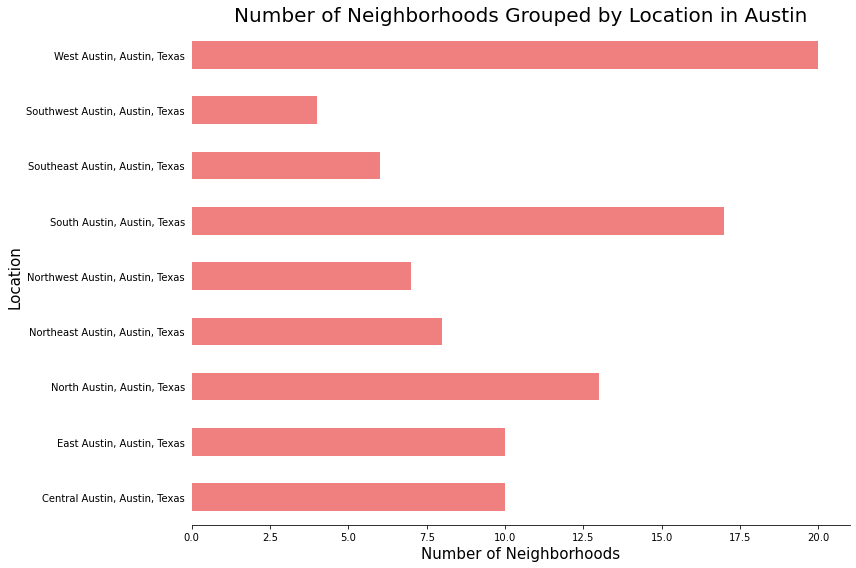

In [24]:
# creating a plot with number of sub_neighborhoods
fig = plt.figure(figsize=(12,8))

ax = neighborhoods_austin.plot(kind='barh', color='lightcoral')
ax.set_title('Number of Neighborhoods Grouped by Location in Austin', fontsize=20)
ax.set_xlabel('Number of Neighborhoods', fontsize=15)
ax.set_ylabel('Location', fontsize=15)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.tick_params(which='major', left=False)

fig.tight_layout()
plt.savefig('Number of Neighborhoods Grouped by Location in Austin.jpg')

##  Folium
The geographical coordinates for Austin neughborhoods data have been obtained from the GeoPy library. This data is relevant for plotting the map of Austin using the Folium library. The geocoder library has been used to obtain latitude, longitude, zip code data for the neighborhoods in Austin. Plotting maps with Folium is easier than you think. Folium provides the folium.Map() class which takes location parameter in terms of latitude and longitude and generates a map around it.

In [25]:
address = 'Austin, Texas'
geolocator = Nominatim(user_agent="geoapiExercises")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinates of Austin are {}, {}.'.format(latitude, longitude))

The geograpical coordinates of Austin are 30.2711286, -97.7436995.


In [27]:
map_austin = folium.Map(location=[latitude, longitude], zoom_start=10)

for lat, lng, area, neighborhood in zip(df['Latitude'], df['Longitude'], df['area'], df['neighbourhood']):
    label = '{}, {}'.format(neighborhood, area)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_austin)  

map_austin.save(outfile= "Neighborhoods_map_Austin.html")
map_austin

### Exploring the first neighborhood in our dataframe for Venues
### FourSquare Api -  for generating the recomendations
The venue data has been extracted using the Foursquare API. This data contains venue recommendations for all neighborhoods in Dallas and is used to study the popular venues of different neighborhoods. I will request this data from Foursquare API and collect information for the top 50 venues in the neighborhoods within a radius of 6500 meters.

In [29]:
radius = 6500
lat = 30.381732
long = -97.798996

In [143]:
# creating the url using latitude and longitude
url = ("https://api.foursquare.com/v3/places/search?ll="+str(lat)+"%2C"+str(long)+"&radius="+str(radius)+"&categories=13199&limit=50")
url

'https://api.foursquare.com/v3/places/search?ll=30.381732%2C-97.798996&radius=6500&categories=13199&limit=50'

In [144]:
# generating the recommendations using Api_Keys and headers with the authorization
headers = {
    "Accept": "application/json",
    "Authorization": "***************************************"
}

# getting the response from the URL
response = requests.request("GET", url, headers=headers)

# printing the output
print(response.json())

{'results': [{'fsq_id': '5565fe94498e38737acbb7c4', 'categories': [{'id': 13199, 'name': 'Indian Restaurant', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}}], 'census_block': '484530323003001', 'chains': [], 'distance': 5093, 'geocodes': {'main': {'latitude': 30.354916, 'longitude': -97.75609}}, 'location': {'address': '3616 Far West Blvd', 'country': 'US', 'cross_street': '', 'dma': 'Austin', 'formatted_address': '3616 Far West Blvd, Austin, TX 78731', 'locality': 'Austin', 'neighborhood': ['Allandale'], 'postcode': '78731', 'region': 'TX'}, 'name': 'Saffron Indian & Nepalese Cuisine', 'related_places': {}, 'timezone': 'America/Chicago'}, {'fsq_id': '55f4667b498eaff0957a4c3b', 'categories': [{'id': 13199, 'name': 'Indian Restaurant', 'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_', 'suffix': '.png'}}], 'chains': [], 'distance': 5747, 'geocodes': {'main': {'latitude': 30.406236, 'longitude': -97.746518}, 'roof': {'l

#### filtering the Json to extract the needed parameters

In [145]:
a = response.json()

In [146]:
type(a)

dict

In [147]:
a.keys()

dict_keys(['results', 'context'])

In [148]:
#a['context'] #nothing
a['results']

[{'fsq_id': '5565fe94498e38737acbb7c4',
  'categories': [{'id': 13199,
    'name': 'Indian Restaurant',
    'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_',
     'suffix': '.png'}}],
  'census_block': '484530323003001',
  'chains': [],
  'distance': 5093,
  'geocodes': {'main': {'latitude': 30.354916, 'longitude': -97.75609}},
  'location': {'address': '3616 Far West Blvd',
   'country': 'US',
   'cross_street': '',
   'dma': 'Austin',
   'formatted_address': '3616 Far West Blvd, Austin, TX 78731',
   'locality': 'Austin',
   'neighborhood': ['Allandale'],
   'postcode': '78731',
   'region': 'TX'},
  'name': 'Saffron Indian & Nepalese Cuisine',
  'related_places': {},
  'timezone': 'America/Chicago'},
 {'fsq_id': '55f4667b498eaff0957a4c3b',
  'categories': [{'id': 13199,
    'name': 'Indian Restaurant',
    'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_',
     'suffix': '.png'}}],
  'chains': [],
  'distance': 5747,
  'geocodes': {'mai

In [44]:
type(a['results'])

list

In [45]:
len(a['results'])

10

In [149]:
a['results'][0]

{'fsq_id': '5565fe94498e38737acbb7c4',
 'categories': [{'id': 13199,
   'name': 'Indian Restaurant',
   'icon': {'prefix': 'https://ss3.4sqi.net/img/categories_v2/food/indian_',
    'suffix': '.png'}}],
 'census_block': '484530323003001',
 'chains': [],
 'distance': 5093,
 'geocodes': {'main': {'latitude': 30.354916, 'longitude': -97.75609}},
 'location': {'address': '3616 Far West Blvd',
  'country': 'US',
  'cross_street': '',
  'dma': 'Austin',
  'formatted_address': '3616 Far West Blvd, Austin, TX 78731',
  'locality': 'Austin',
  'neighborhood': ['Allandale'],
  'postcode': '78731',
  'region': 'TX'},
 'name': 'Saffron Indian & Nepalese Cuisine',
 'related_places': {},
 'timezone': 'America/Chicago'}

In [154]:
a['results'][0]['geocodes']['main']['latitude']
a['results'][0]['geocodes']['main']['longitude']

30.354916

In [155]:
print ((
    a['results'][0]['categories'][0]['id'],
    a['results'][0]['categories'][0]['name'],
    a['results'][0]['name'],
    a['results'][0]['location']['neighborhood'][0],
    a['results'][0]['geocodes']['main']['latitude'],
    a['results'][0]['geocodes']['main']['longitude']
))

(13199, 'Indian Restaurant', 'Saffron Indian & Nepalese Cuisine', 'Allandale', 30.354916, -97.75609)


In [160]:
venue = pd.DataFrame(columns = ['id','type','name','neighborhood','coordinates'])

In [161]:
# creating the venues list from all the coordinates.
for i in range(len(a['results'])):
    dict = {'id':a['results'][i]['categories'][0]['id'],
            'type':a['results'][i]['categories'][0]['name'],
            'name':a['results'][i]['name'],
                'neighborhood':a['results'][i]['location']['neighborhood'][0],
                'coordinates':a['results'][i]['geocodes']['main'],
                'latitude':a['results'][i]['geocodes']['main']['latitude'],
                'longitude': a['results'][i]['geocodes']['main']['longitude']
           }
    venue = venue.append(dict, ignore_index = True)

In [162]:
venue

,id,type,name,neighborhood,coordinates,latitude,longitude
0,13199,Indian Restaurant,Saffron Indian & Nepalese Cuisine,Allandale,"{'latitude': 30.354916, 'longitude': -97.75609}",30.354916,-97.756090
1,13199,Indian Restaurant,Hyderabad House,Arboretum,"{'latitude': 30.406236, 'longitude': -97.746518}",30.406236,-97.746518
2,13199,Indian Restaurant,Bombay Bistro,Gateway,"{'latitude': 30.398793, 'longitude': -97.74816}",30.398793,-97.748160
3,13199,Indian Restaurant,Royal India,Arboretum,"{'latitude': 30.406876, 'longitude': -97.746903}",30.406876,-97.746903
4,13199,Indian Restaurant,Biryani & Co.,Arboretum,"{'latitude': 30.406876, 'longitude': -97.746903}",30.406876,-97.746903
5,13199,Indian Restaurant,Himalaya Kosheli,Barrington Oaks,"{'latitude': 30.43342, 'longitude': -97.771116}",30.433420,-97.771116
6,13199,Indian Restaurant,Chicha's Fire And Grill,Barrington Oaks,"{'latitude': 30.430727, 'longitude': -97.764344}",30.430727,-97.764344
7,13199,Indian Restaurant,IndiaGate,Barrington Oaks,"{'latitude': 30.431027, 'longitude': -97.764782}",30.431027,-97.764782
8,13030,Buffet,Saffron,Allandale,"{'latitude': 30.35501, 'longitude': -97.755598}",30.355010,-97.755598
9,13072,Asian Restaurant,Himalaya Koshli Nepali & Indian Restaurant,Barrington Oaks,"{'latitude': 30.433151, 'longitude': -97.771711}",30.433151,-97.771711


##   Explore Neighborhoods in Austin

#### repeat the same process to all the neighborhoods 

In [163]:
df

,neighbourhood,area,Latitude,Longitude
0,Old West Austin,"Central Austin, Austin, Texas",30.352132,-97.751304
1,Old Enfield,"Central Austin, Austin, Texas",30.280096,-97.753479
2,Windsor Road,"Central Austin, Austin, Texas",30.292419,-97.760435
3,Bryker Woods,"Central Austin, Austin, Texas",30.271488,-97.751528
4,Rosedale,"Central Austin, Austin, Texas",30.313651,-97.743861
...,...,...,...,...
90,Lakeway,"West Austin, Austin, Texas",30.356841,-97.983321
91,Hudson Bend,"West Austin, Austin, Texas",30.393709,-97.765157
92,River Place,"West Austin, Austin, Texas",30.390882,-97.848017
93,Comanche Trail,"West Austin, Austin, Texas",30.394465,-97.869205


In [164]:
venues = pd.DataFrame(columns = ['id','type','name','neighborhood','coordinates'])
radius = 6500
for k in range(len(df)):
    lat = df.loc[k,'Latitude']
    long = df.loc[k,'Longitude']
    neighbourhood_actual = df.loc[k,'neighbourhood']
    area = df.loc[k,'area']
    
    url = ("https://api.foursquare.com/v3/places/search?ll="+str(lat)+"%2C"+str(long)+"&radius="+str(radius)+"&categories=13199&limit=50")
    
    
    headers = {
    "Accept": "application/json",
    "Authorization": "fsq3azyA91+sAFiO0McbKBP+aarZhbf4qeyh7HP8HEI20b8="
    }

    
    #response = requests.request("GET", url, headers=headers)  
    a = response.json()
    
    
    for i in range(len(a['results'])):
        if 'neighborhood' in a['results'][i]['location'].keys():
            dict = {'id':a['results'][i]['categories'][0]['id'],
                    'type':a['results'][i]['categories'][0]['name'],
                    'name':a['results'][i]['name'],
                     'neighborhood':a['results'][i]['location']['neighborhood'][0],
                     'neighbourhood_actual': neighbourhood_actual,
                     'latitude':a['results'][i]['geocodes']['main']['latitude'],
                     'longitude':a['results'][i]['geocodes']['main']['longitude'],
                      'area': area
                   }
            venues = venues.append(dict, ignore_index = True)
        else:
            dict = {'id':a['results'][i]['categories'][0]['id'],
                    'type':a['results'][i]['categories'][0]['name'],
                    'name':a['results'][i]['name'],
                     'neighborhood':'Nan',
                     'neighbourhood_actual': neighbourhood_actual,
                     'latitude':'Nan',
                     'longitude':'Nan',
                     'area': area
                   }
            venues = venues.append(dict, ignore_index = True)



In [165]:
venues

,id,type,name,neighborhood,coordinates,area,latitude,longitude,neighbourhood_actual
0,13199,Indian Restaurant,Tarka Indian Kitchen,North Austin,NaN,"Central Austin, Austin, Texas",30.357009,-97.735385,Old West Austin
1,13199,Indian Restaurant,Saffron Indian & Nepalese Cuisine,Allandale,NaN,"Central Austin, Austin, Texas",30.354916,-97.75609,Old West Austin
2,13199,Indian Restaurant,Hyderabad House,Arboretum,NaN,"Central Austin, Austin, Texas",30.406236,-97.746518,Old West Austin
3,13199,Indian Restaurant,Bombay Bistro,Gateway,NaN,"Central Austin, Austin, Texas",30.398793,-97.74816,Old West Austin
4,13199,Indian Restaurant,Tarka Indian Kitchen,North Austin,NaN,"Central Austin, Austin, Texas",30.400868,-97.722613,Old West Austin
...,...,...,...,...,...,...,...,...,...
1531,13199,Indian Restaurant,Himalaya Kosheli,Barrington Oaks,NaN,"West Austin, Austin, Texas",30.43342,-97.771116,Jester Estates
1532,13199,Indian Restaurant,Chicha's Fire And Grill,Barrington Oaks,NaN,"West Austin, Austin, Texas",30.430727,-97.764344,Jester Estates
1533,13199,Indian Restaurant,IndiaGate,Barrington Oaks,NaN,"West Austin, Austin, Texas",30.431027,-97.764782,Jester Estates
1534,13030,Buffet,Saffron,Allandale,NaN,"West Austin, Austin, Texas",30.35501,-97.755598,Jester Estates


In [167]:
#venues.to_csv('Venues_from_api_full.csv')

In [5]:
venues = pd.read_csv('C:/Users/Authorized User1/Desktop/DATA/Project/recommender system/restaurants recommendation/api data/Venues_from_api_full.csv')

In [6]:
venues.head(5)

,Column1,id,type,name,neighborhood,coordinates,area,latitude,longitude,neighbourhood_actual
0,0,13199,Indian Restaurant,Tarka Indian Kitchen,North Austin,NaN,"Central Austin, Austin, Texas",30.357009,-97.735385,Old West Austin
1,1,13199,Indian Restaurant,Saffron Indian & Nepalese Cuisine,Allandale,NaN,"Central Austin, Austin, Texas",30.354916,-97.756090,Old West Austin
2,2,13199,Indian Restaurant,Hyderabad House,Arboretum,NaN,"Central Austin, Austin, Texas",30.406236,-97.746518,Old West Austin
3,3,13199,Indian Restaurant,Bombay Bistro,Gateway,NaN,"Central Austin, Austin, Texas",30.398793,-97.748160,Old West Austin
4,4,13199,Indian Restaurant,Tarka Indian Kitchen,North Austin,NaN,"Central Austin, Austin, Texas",30.400868,-97.722613,Old West Austin


In [7]:
venues.drop(['Column1','id','neighborhood','coordinates'],axis = 1,inplace = True)
venues.rename(columns = {'type':'venue_type','name':'venue_name','coordinates' : 'venue_coordinates','area' : 'venue_area', 'neighbourhood_actual' : 'venue_neighborhood','latitude' : 'venue_latitude','longitude' : 'venue_longitude'},inplace = True)

In [8]:
venues.isna().sum()

venue_type            0
venue_name            0
venue_area            0
venue_latitude        0
venue_longitude       0
venue_neighborhood    0
dtype: int64

In [9]:
venues

,venue_type,venue_name,venue_area,venue_latitude,venue_longitude,venue_neighborhood
0,Indian Restaurant,Tarka Indian Kitchen,"Central Austin, Austin, Texas",30.357009,-97.735385,Old West Austin
1,Indian Restaurant,Saffron Indian & Nepalese Cuisine,"Central Austin, Austin, Texas",30.354916,-97.756090,Old West Austin
2,Indian Restaurant,Hyderabad House,"Central Austin, Austin, Texas",30.406236,-97.746518,Old West Austin
3,Indian Restaurant,Bombay Bistro,"Central Austin, Austin, Texas",30.398793,-97.748160,Old West Austin
4,Indian Restaurant,Tarka Indian Kitchen,"Central Austin, Austin, Texas",30.400868,-97.722613,Old West Austin
...,...,...,...,...,...,...
1505,Indian Restaurant,Himalaya Kosheli,"West Austin, Austin, Texas",30.433420,-97.771116,Jester Estates
1506,Indian Restaurant,Chicha's Fire And Grill,"West Austin, Austin, Texas",30.430727,-97.764344,Jester Estates
1507,Indian Restaurant,IndiaGate,"West Austin, Austin, Texas",30.431027,-97.764782,Jester Estates
1508,Buffet,Saffron,"West Austin, Austin, Texas",30.355010,-97.755598,Jester Estates


In [10]:
venues

,venue_type,venue_name,venue_area,venue_latitude,venue_longitude,venue_neighborhood
0,Indian Restaurant,Tarka Indian Kitchen,"Central Austin, Austin, Texas",30.357009,-97.735385,Old West Austin
1,Indian Restaurant,Saffron Indian & Nepalese Cuisine,"Central Austin, Austin, Texas",30.354916,-97.756090,Old West Austin
2,Indian Restaurant,Hyderabad House,"Central Austin, Austin, Texas",30.406236,-97.746518,Old West Austin
3,Indian Restaurant,Bombay Bistro,"Central Austin, Austin, Texas",30.398793,-97.748160,Old West Austin
4,Indian Restaurant,Tarka Indian Kitchen,"Central Austin, Austin, Texas",30.400868,-97.722613,Old West Austin
...,...,...,...,...,...,...
1505,Indian Restaurant,Himalaya Kosheli,"West Austin, Austin, Texas",30.433420,-97.771116,Jester Estates
1506,Indian Restaurant,Chicha's Fire And Grill,"West Austin, Austin, Texas",30.430727,-97.764344,Jester Estates
1507,Indian Restaurant,IndiaGate,"West Austin, Austin, Texas",30.431027,-97.764782,Jester Estates
1508,Buffet,Saffron,"West Austin, Austin, Texas",30.355010,-97.755598,Jester Estates


In [11]:
# checking for the unique categories of venues in Austin
print('There are {} uniques categories.'.format(venues['venue_type'].unique()))

There are ['Indian Restaurant' 'Fast Food Restaurant' 'Halal Restaurant' 'Buffet'
 'Bar' 'Bistro' 'Dessert Shop' 'Asian Restaurant' 'Chinese Restaurant'
 'South Indian Restaurant'] uniques categories.


In [12]:
# printing the top 10 most popular venues 
top_n = 10
top_n_venues = (venues[['venue_type']].value_counts()[:top_n])
print(top_n_venues)
top_n_venues= top_n_venues.reset_index()['venue_type']

venue_type             
Indian Restaurant          981
Fast Food Restaurant       120
Halal Restaurant            80
Asian Restaurant            75
Chinese Restaurant          70
Buffet                      65
Bar                         39
Dessert Shop                38
Bistro                      23
South Indian Restaurant     19
dtype: int64


### Most common venue type of restaurant

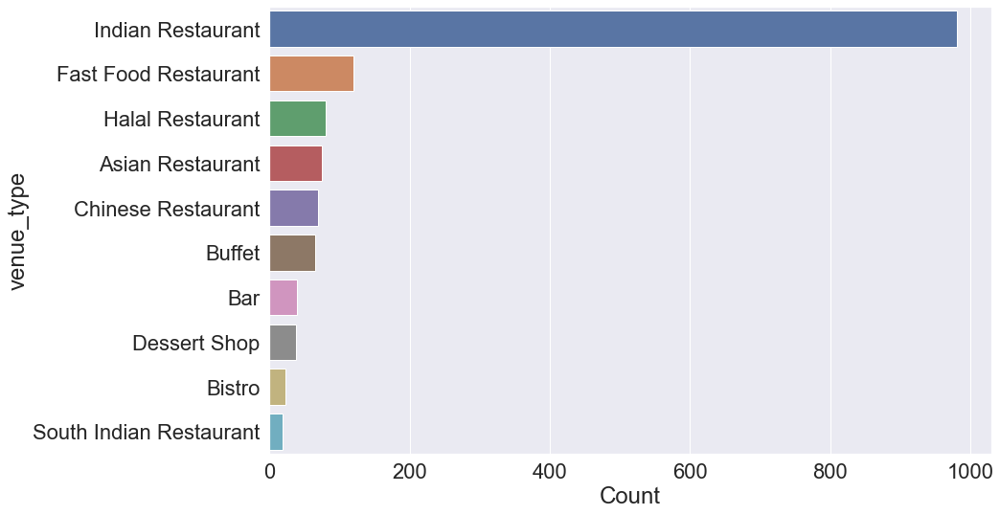

In [13]:
# creating a plot for most common venue type
fig = plt.figure(figsize=(15,8))
Austin_venues = pd.DataFrame(venues[['venue_type']].value_counts()).reset_index()[:top_n]
Austin_venues.columns = ['venue_type', 'Count']
sns.set(font_scale = 2)
sns.barplot(x="Count", y="venue_type", data=Austin_venues)
fig.tight_layout()

### Top 10 neighbourhood with most number of Indian restaurant   

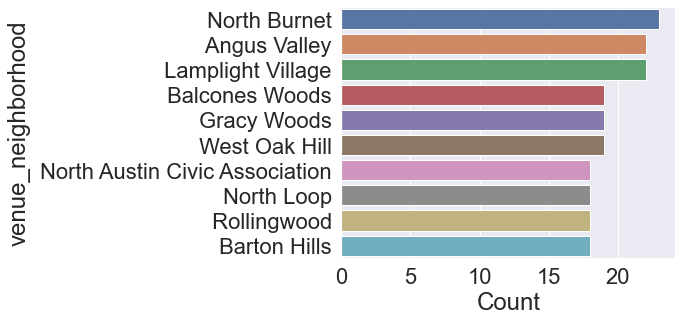

In [14]:
# neighborhoods according to the popularity of indian restaurant
df_type = venues[venues['venue_type'] == 'Indian Restaurant']

fig = plt.figure(figsize=(10,5))
venues_1 = pd.DataFrame(df_type[['venue_neighborhood']].value_counts()).reset_index()[:top_n]
venues_1.columns = ['venue_neighborhood', 'Count']
sns.set(font_scale = 2)
sns.barplot(x="Count", y="venue_neighborhood", data=venues_1)
fig.tight_layout()

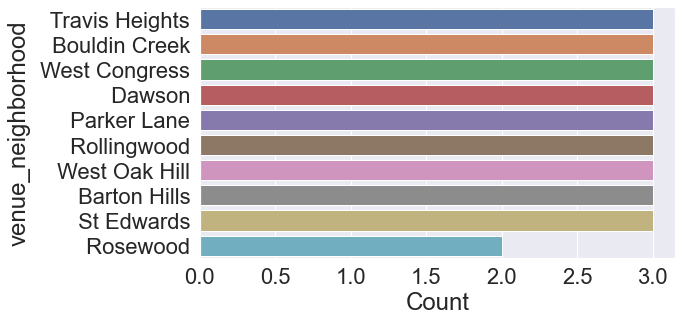

In [15]:
# neighborhoods according to the popularity of fast food restaurant
df_type = venues[venues['venue_type'] == 'Fast Food Restaurant']

fig = plt.figure(figsize=(10,5))
venues_1 = pd.DataFrame(df_type[['venue_neighborhood']].value_counts()).reset_index()[:top_n]
venues_1.columns = ['venue_neighborhood', 'Count']
sns.set(font_scale = 2)
sns.barplot(x="Count", y="venue_neighborhood", data=venues_1)
fig.tight_layout()

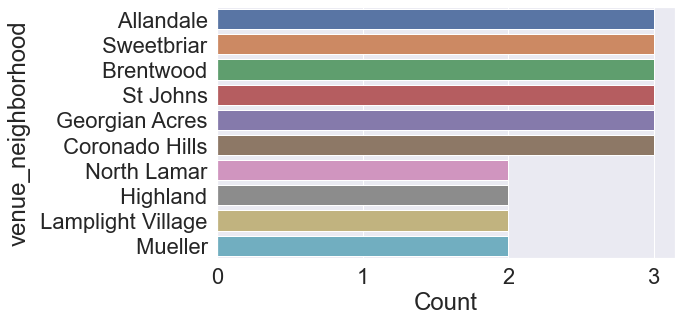

In [16]:
# neighborhoods according to the popularity of halal restaurant
df_type = venues[venues['venue_type'] == 'Halal Restaurant']

fig = plt.figure(figsize=(10,5))
venues_1 = pd.DataFrame(df_type[['venue_neighborhood']].value_counts()).reset_index()[:top_n]
venues_1.columns = ['venue_neighborhood', 'Count']
sns.set(font_scale = 2)
sns.barplot(x="Count", y="venue_neighborhood", data=venues_1)
fig.tight_layout()

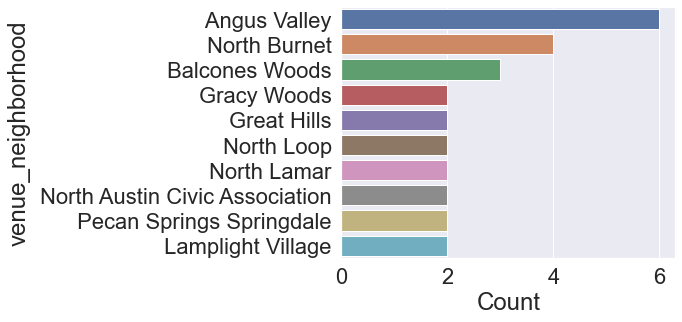

In [17]:
# neighborhoods according to the popularity of Asian restaurant

df_type = venues[venues['venue_type'] == 'Asian Restaurant']

fig = plt.figure(figsize=(10,5))
venues_1 = pd.DataFrame(df_type[['venue_neighborhood']].value_counts()).reset_index()[:top_n]
venues_1.columns = ['venue_neighborhood', 'Count']
sns.set(font_scale = 2)
sns.barplot(x="Count", y="venue_neighborhood", data=venues_1)
fig.tight_layout()

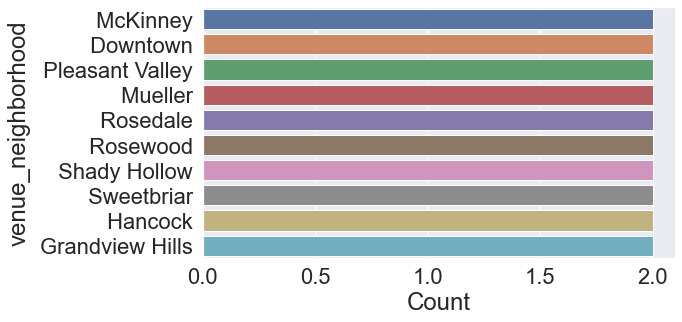

In [18]:
# neighborhoods according to the popularity of chinese restaurant
 
df_type = venues[venues['venue_type'] == 'Chinese Restaurant']

fig = plt.figure(figsize=(10,5))
venues_1 = pd.DataFrame(df_type[['venue_neighborhood']].value_counts()).reset_index()[:top_n]
venues_1.columns = ['venue_neighborhood', 'Count']
sns.set(font_scale = 2)
sns.barplot(x="Count", y="venue_neighborhood", data=venues_1)
fig.tight_layout()

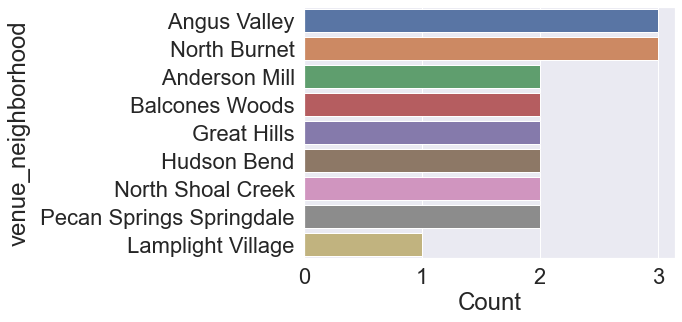

In [19]:
# neighborhoods according to the popularity of south indian restaurant
df_type = venues[venues['venue_type'] == 'South Indian Restaurant']

fig = plt.figure(figsize=(10,5))
venues_1 = pd.DataFrame(df_type[['venue_neighborhood']].value_counts()).reset_index()[:top_n]
venues_1.columns = ['venue_neighborhood', 'Count']
sns.set(font_scale = 2)
sns.barplot(x="Count", y="venue_neighborhood", data=venues_1)
fig.tight_layout()

In [20]:
# Getting the coordinates for the austin
address = 'Austin, Texas'
geolocator = Nominatim(user_agent="geoapiExercises")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinates of Austin are {}, {}.'.format(latitude, longitude))

The geograpical coordinates of Austin are 30.2711286, -97.7436995.


### Mapping all venue types in Austin

In [21]:
# plotting all the venues in the austin area
venues_map = folium.Map(location=[latitude, longitude], zoom_start=10)

for lat, lng, area, neighborhood,name in zip(venues['venue_latitude'], venues['venue_longitude'], venues['venue_area'], venues['venue_neighborhood'],venues['venue_name']):
    label = '{}, {}, {},'.format(name, neighborhood, area)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(venues_map)  

venues_map.save(outfile= "venues_map.html")
venues_map

### Mapping Indian Restaurant  in Austin
As our buisness objective to find the places to open an indian restaurant.

In [22]:
# plotting all indian restaurant in Ausin neighborhoods.
venues_ind = venues[venues['venue_type'] == 'Indian Restaurant']
venues_map = folium.Map(location=[latitude, longitude], zoom_start=10)

for lat, lng, area, neighborhood,name in zip(venues_ind['venue_latitude'], venues_ind['venue_longitude'], venues_ind['venue_area'], venues_ind['venue_neighborhood'],venues_ind['venue_name']):
    label = '{}, {}, {},'.format(name, neighborhood, area)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='red',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(venues_map)  

venues_map.save(outfile= "venues_map_ind.html")
venues_map

## Data Preprocessing

In [23]:
# one hot encoding
Tn_onehot = pd.get_dummies(venues[['venue_type']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
Tn_onehot['Neighborhood'] = venues['venue_neighborhood'] 

# move neighborhood column to the first column
Tn_onehot = Tn_onehot.set_index('Neighborhood').reset_index()

Tn_onehot

,Neighborhood,Asian Restaurant,Bar,Bistro,Buffet,Chinese Restaurant,Dessert Shop,Fast Food Restaurant,Halal Restaurant,Indian Restaurant,South Indian Restaurant
0,Old West Austin,0,0,0,0,0,0,0,0,1,0
1,Old West Austin,0,0,0,0,0,0,0,0,1,0
2,Old West Austin,0,0,0,0,0,0,0,0,1,0
3,Old West Austin,0,0,0,0,0,0,0,0,1,0
4,Old West Austin,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...
1505,Jester Estates,0,0,0,0,0,0,0,0,1,0
1506,Jester Estates,0,0,0,0,0,0,0,0,1,0
1507,Jester Estates,0,0,0,0,0,0,0,0,1,0
1508,Jester Estates,0,0,0,1,0,0,0,0,0,0


In [24]:
len(Tn_onehot[Tn_onehot['Indian Restaurant'] == 1])

981

In [25]:
Tn_onehot.shape

(1510, 11)

In [26]:
# calculating the mean number of restaurant in the neiborhood
tn_mean = Tn_onehot.groupby('Neighborhood').mean().reset_index()
tn_mean

,Neighborhood,Asian Restaurant,Bar,Bistro,Buffet,Chinese Restaurant,Dessert Shop,Fast Food Restaurant,Halal Restaurant,Indian Restaurant,South Indian Restaurant
0,Allandale,0.000000,0.000000,0.000000,0.062500,0.062500,0.000000,0.062500,0.187500,0.625000,0.000000
1,Anderson Mill,0.083333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.750000,0.166667
2,Angus Valley,0.171429,0.000000,0.000000,0.057143,0.028571,0.000000,0.028571,0.000000,0.628571,0.085714
3,Austin Lake Estates,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,0.083333,0.041667,0.625000,0.000000
4,Avery Ranch,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
81,Windsor Hills,0.041667,0.041667,0.000000,0.041667,0.041667,0.041667,0.083333,0.041667,0.666667,0.000000
82,Windsor Park,0.041667,0.041667,0.000000,0.041667,0.041667,0.041667,0.083333,0.041667,0.666667,0.000000
83,Windsor Road,0.041667,0.041667,0.000000,0.041667,0.041667,0.041667,0.083333,0.041667,0.666667,0.000000
84,Wooten,0.000000,0.000000,0.000000,0.062500,0.000000,0.000000,0.062500,0.125000,0.750000,0.000000


In [27]:
# counting the number of restaurant in the neiborhood
tn_count = Tn_onehot.groupby('Neighborhood').count().reset_index()
tn_count

,Neighborhood,Asian Restaurant,Bar,Bistro,Buffet,Chinese Restaurant,Dessert Shop,Fast Food Restaurant,Halal Restaurant,Indian Restaurant,South Indian Restaurant
0,Allandale,16,16,16,16,16,16,16,16,16,16
1,Anderson Mill,12,12,12,12,12,12,12,12,12,12
2,Angus Valley,35,35,35,35,35,35,35,35,35,35
3,Austin Lake Estates,24,24,24,24,24,24,24,24,24,24
4,Avery Ranch,6,6,6,6,6,6,6,6,6,6
...,...,...,...,...,...,...,...,...,...,...,...
81,Windsor Hills,24,24,24,24,24,24,24,24,24,24
82,Windsor Park,24,24,24,24,24,24,24,24,24,24
83,Windsor Road,24,24,24,24,24,24,24,24,24,24
84,Wooten,16,16,16,16,16,16,16,16,16,16


In [28]:
# neiborhoods with top 5 types of restaurant
num_top_venues = 5

for hood in tn_mean['Neighborhood']:
    print("----"+hood+"----")
    temp = tn_mean[tn_mean['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

---- Allandale----
                  venue  freq
0     Indian Restaurant  0.62
1      Halal Restaurant  0.19
2                Buffet  0.06
3    Chinese Restaurant  0.06
4  Fast Food Restaurant  0.06


---- Anderson Mill----
                     venue  freq
0        Indian Restaurant  0.75
1  South Indian Restaurant  0.17
2         Asian Restaurant  0.08
3                      Bar  0.00
4                   Bistro  0.00


---- Angus Valley----
                     venue  freq
0        Indian Restaurant  0.63
1         Asian Restaurant  0.17
2  South Indian Restaurant  0.09
3                   Buffet  0.06
4       Chinese Restaurant  0.03


---- Austin Lake Estates----
                  venue  freq
0     Indian Restaurant  0.62
1  Fast Food Restaurant  0.08
2      Asian Restaurant  0.04
3                   Bar  0.04
4                Bistro  0.04


---- Avery Ranch----
               venue  freq
0  Indian Restaurant   1.0
1   Asian Restaurant   0.0
2                Bar   0.0
3             

                     venue  freq
0        Indian Restaurant  0.68
1         Asian Restaurant  0.12
2  South Indian Restaurant  0.09
3                   Buffet  0.06
4       Chinese Restaurant  0.03


---- North Lamar----
                  venue  freq
0     Indian Restaurant  0.65
1      Asian Restaurant  0.08
2                Buffet  0.08
3  Fast Food Restaurant  0.08
4      Halal Restaurant  0.08


---- North Loop----
                  venue  freq
0     Indian Restaurant  0.72
1      Asian Restaurant  0.08
2                Buffet  0.08
3      Halal Restaurant  0.08
4  Fast Food Restaurant  0.04


---- North Shoal Creek----
                     venue  freq
0        Indian Restaurant  0.64
1         Asian Restaurant  0.09
2         Halal Restaurant  0.09
3  South Indian Restaurant  0.09
4                   Buffet  0.05


---- Northwest Hills----
               venue  freq
0  Indian Restaurant  0.75
1             Buffet  0.25
2   Asian Restaurant  0.00
3                Bar  0.00
4       

In [29]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [30]:
# neigborhoods with common restaurant type
import numpy as np
num_top_venues = 5

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = tn_mean['Neighborhood']

for ind in np.arange(tn_mean.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(tn_mean.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue
0,Allandale,Indian Restaurant,Halal Restaurant,Buffet,Chinese Restaurant,Fast Food Restaurant
1,Anderson Mill,Indian Restaurant,South Indian Restaurant,Asian Restaurant,Bar,Bistro
2,Angus Valley,Indian Restaurant,Asian Restaurant,South Indian Restaurant,Buffet,Chinese Restaurant
3,Austin Lake Estates,Indian Restaurant,Fast Food Restaurant,Asian Restaurant,Bar,Bistro
4,Avery Ranch,Indian Restaurant,Asian Restaurant,Bar,Bistro,Buffet
...,...,...,...,...,...,...
81,Windsor Hills,Indian Restaurant,Fast Food Restaurant,Asian Restaurant,Bar,Buffet
82,Windsor Park,Indian Restaurant,Fast Food Restaurant,Asian Restaurant,Bar,Buffet
83,Windsor Road,Indian Restaurant,Fast Food Restaurant,Asian Restaurant,Bar,Buffet
84,Wooten,Indian Restaurant,Halal Restaurant,Buffet,Fast Food Restaurant,Asian Restaurant


In [31]:
tn_mean

,Neighborhood,Asian Restaurant,Bar,Bistro,Buffet,Chinese Restaurant,Dessert Shop,Fast Food Restaurant,Halal Restaurant,Indian Restaurant,South Indian Restaurant
0,Allandale,0.000000,0.000000,0.000000,0.062500,0.062500,0.000000,0.062500,0.187500,0.625000,0.000000
1,Anderson Mill,0.083333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.750000,0.166667
2,Angus Valley,0.171429,0.000000,0.000000,0.057143,0.028571,0.000000,0.028571,0.000000,0.628571,0.085714
3,Austin Lake Estates,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,0.083333,0.041667,0.625000,0.000000
4,Avery Ranch,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
81,Windsor Hills,0.041667,0.041667,0.000000,0.041667,0.041667,0.041667,0.083333,0.041667,0.666667,0.000000
82,Windsor Park,0.041667,0.041667,0.000000,0.041667,0.041667,0.041667,0.083333,0.041667,0.666667,0.000000
83,Windsor Road,0.041667,0.041667,0.000000,0.041667,0.041667,0.041667,0.083333,0.041667,0.666667,0.000000
84,Wooten,0.000000,0.000000,0.000000,0.062500,0.000000,0.000000,0.062500,0.125000,0.750000,0.000000


In [32]:
tn_mean_clustering = tn_mean.drop('Neighborhood', 1)
tn_mean_ind = tn_mean[['Indian Restaurant']] 

C:\Users\AUTHOR~1\AppData\Local\Temp/ipykernel_14632/1807422531.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  tn_mean_clustering = tn_mean.drop('Neighborhood', 1)


In [33]:
tn_mean_ind 

,Indian Restaurant
0,0.625000
1,0.750000
2,0.628571
3,0.625000
4,1.000000
...,...
81,0.666667
82,0.666667
83,0.666667
84,0.750000


In [34]:
tn_mean_clustering

,Asian Restaurant,Bar,Bistro,Buffet,Chinese Restaurant,Dessert Shop,Fast Food Restaurant,Halal Restaurant,Indian Restaurant,South Indian Restaurant
0,0.000000,0.000000,0.000000,0.062500,0.062500,0.000000,0.062500,0.187500,0.625000,0.000000
1,0.083333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.750000,0.166667
2,0.171429,0.000000,0.000000,0.057143,0.028571,0.000000,0.028571,0.000000,0.628571,0.085714
3,0.041667,0.041667,0.041667,0.041667,0.041667,0.041667,0.083333,0.041667,0.625000,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...
81,0.041667,0.041667,0.000000,0.041667,0.041667,0.041667,0.083333,0.041667,0.666667,0.000000
82,0.041667,0.041667,0.000000,0.041667,0.041667,0.041667,0.083333,0.041667,0.666667,0.000000
83,0.041667,0.041667,0.000000,0.041667,0.041667,0.041667,0.083333,0.041667,0.666667,0.000000
84,0.000000,0.000000,0.000000,0.062500,0.000000,0.000000,0.062500,0.125000,0.750000,0.000000


In [35]:
from sklearn.cluster import KMeans
model_Kmeans = KMeans()

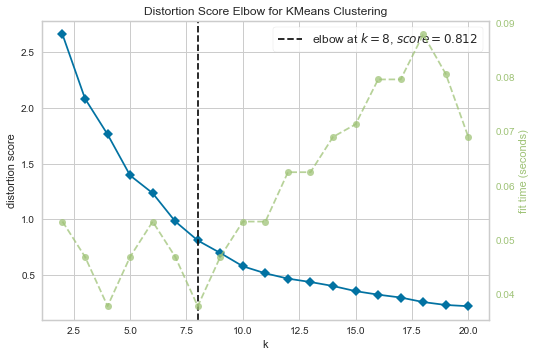

In [36]:
# clustering for all venues
from yellowbrick.cluster import KElbowVisualizer
visualizer = KElbowVisualizer(model_Kmeans, k = (2,21))
visualizer.fit(tn_mean_clustering)
visualizer.show();

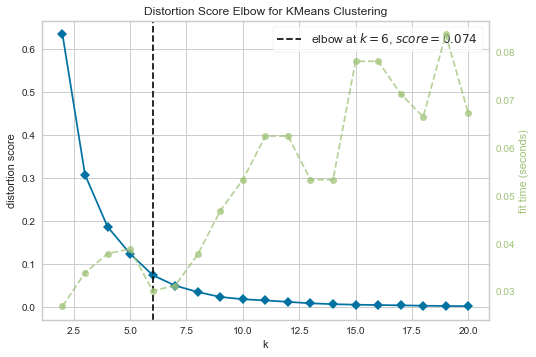

In [37]:
# clustering for Indian restaurant
from yellowbrick.cluster import KElbowVisualizer
visualizer = KElbowVisualizer(model_Kmeans, k = (2,21))
visualizer.fit(tn_mean_ind)
visualizer.show();

In [38]:
# generating the labels for the neighborhood according to the indian restaurant
kmeans_ind = KMeans(n_clusters= 6).fit(tn_mean_ind)
kmeans_ind.labels_

array([0, 5, 0, 0, 2, 4, 4, 5, 4, 0, 0, 4, 5, 0, 4, 2, 5, 4, 0, 0, 0, 0,
       4, 4, 0, 3, 0, 0, 4, 0, 4, 4, 0, 4, 5, 3, 4, 4, 2, 5, 4, 4, 5, 1,
       0, 0, 0, 4, 4, 4, 5, 4, 5, 0, 5, 0, 5, 0, 3, 5, 4, 0, 0, 0, 4, 5,
       4, 0, 0, 3, 4, 0, 0, 4, 4, 0, 4, 4, 4, 5, 0, 4, 4, 4, 5, 5])

In [39]:
# appending the labels to the dataframe
tn_count['labels'] = kmeans_ind.labels_
tn_count.head()

,Neighborhood,Asian Restaurant,Bar,Bistro,Buffet,Chinese Restaurant,Dessert Shop,Fast Food Restaurant,Halal Restaurant,Indian Restaurant,South Indian Restaurant,labels
0,Allandale,16,16,16,16,16,16,16,16,16,16,0
1,Anderson Mill,12,12,12,12,12,12,12,12,12,12,5
2,Angus Valley,35,35,35,35,35,35,35,35,35,35,0
3,Austin Lake Estates,24,24,24,24,24,24,24,24,24,24,0
4,Avery Ranch,6,6,6,6,6,6,6,6,6,6,2


In [40]:
# total neiborhoods according to the cluster
tn_count['labels'].value_counts()

4    32
0    30
5    16
3     4
2     3
1     1
Name: labels, dtype: int64

In [41]:
population_austin = pd.read_csv('C:/Users/Authorized User1/Desktop/DATA/Project/recommender system/restaurants recommendation/population/Population_austin.csv',index_col=0)

In [42]:
tn_count

,Neighborhood,Asian Restaurant,Bar,Bistro,Buffet,Chinese Restaurant,Dessert Shop,Fast Food Restaurant,Halal Restaurant,Indian Restaurant,South Indian Restaurant,labels
0,Allandale,16,16,16,16,16,16,16,16,16,16,0
1,Anderson Mill,12,12,12,12,12,12,12,12,12,12,5
2,Angus Valley,35,35,35,35,35,35,35,35,35,35,0
3,Austin Lake Estates,24,24,24,24,24,24,24,24,24,24,0
4,Avery Ranch,6,6,6,6,6,6,6,6,6,6,2
...,...,...,...,...,...,...,...,...,...,...,...,...
81,Windsor Hills,24,24,24,24,24,24,24,24,24,24,4
82,Windsor Park,24,24,24,24,24,24,24,24,24,24,4
83,Windsor Road,24,24,24,24,24,24,24,24,24,24,4
84,Wooten,16,16,16,16,16,16,16,16,16,16,5


In [43]:
# reading the indian population data in Ausitn from the cencus and merging it to the dataframe
tn_count_f = pd.merge(tn_count, population_austin, how='left', left_on='Neighborhood', right_on='neighborhood')

In [44]:
tn_count_f

,Neighborhood,Asian Restaurant,Bar,Bistro,Buffet,Chinese Restaurant,Dessert Shop,Fast Food Restaurant,Halal Restaurant,Indian Restaurant,South Indian Restaurant,labels,population,neighborhood
0,Allandale,16,16,16,16,16,16,16,16,16,16,0,9676,Allandale
1,Anderson Mill,12,12,12,12,12,12,12,12,12,12,5,8953,Anderson Mill
2,Angus Valley,35,35,35,35,35,35,35,35,35,35,0,30561,Angus Valley
3,Austin Lake Estates,24,24,24,24,24,24,24,24,24,24,0,1084,Austin Lake Estates
4,Avery Ranch,6,6,6,6,6,6,6,6,6,6,2,30657,Avery Ranch
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
81,Windsor Hills,24,24,24,24,24,24,24,24,24,24,4,11782,Windsor Hills
82,Windsor Park,24,24,24,24,24,24,24,24,24,24,4,22417,Windsor Park
83,Windsor Road,24,24,24,24,24,24,24,24,24,24,4,6587,Windsor Road
84,Wooten,16,16,16,16,16,16,16,16,16,16,5,6714,Wooten


## KNN Clusters
## Cluster 0

In [45]:
tn_count_f[tn_count_f['labels']==0][['Neighborhood','population','Indian Restaurant']]

,Neighborhood,population,Indian Restaurant
0,Allandale,9676,16
2,Angus Valley,30561,35
3,Austin Lake Estates,1084,24
9,Brentwood,11045,17
10,Bryker Woods,3434,24
13,Central East Austin,9541,21
18,Coronado Hills,3259,11
19,Dawson,3054,26
20,Downtown,10848,21
21,East Cesar Chavez,3350,24


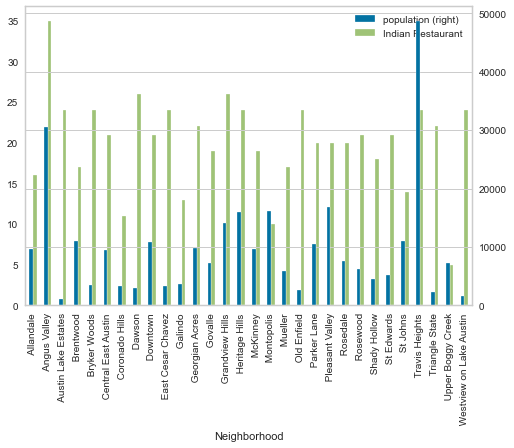

In cluster 0 there is 1 restaurant per 486 people


In [104]:
temp = tn_count_f[tn_count_f['labels']==0][['Neighborhood','population','Indian Restaurant']].set_index('Neighborhood')
temp.plot( kind= 'bar',secondary_y= 'population', rot= 90 )
plt.show()

pop = tn_count_f[tn_count_f['labels']==0][['population']].sum()
res = tn_count_f[tn_count_f['labels']==0][['Indian Restaurant']].sum()
avg = int(pop)/int(res)
print ('In cluster 0 there is 1 restaurant per %d people' %(avg))

## Cluster 1

In [46]:
tn_count_f[tn_count_f['labels']==1][['Neighborhood','population','Indian Restaurant']]

,Neighborhood,population,Indian Restaurant
43,Martin Luther King,5114,1


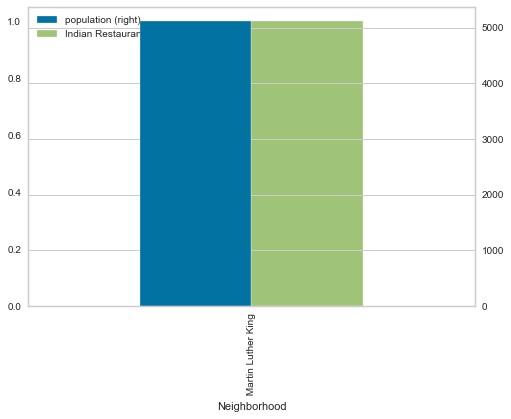

In cluster 1 there is 1 restaurant per 5114 people


In [103]:
temp = tn_count_f[tn_count_f['labels']==1][['Neighborhood','population','Indian Restaurant']].set_index('Neighborhood')
temp.plot( kind= 'bar',secondary_y= 'population', rot= 90 )
plt.show()

pop = tn_count_f[tn_count_f['labels']==1][['population']].sum()
res = tn_count_f[tn_count_f['labels']==1][['Indian Restaurant']].sum()
avg = int(pop)/int(res)
print ('In cluster 1 there is 1 restaurant per %d people' %(avg))

## Cluster 2

In [47]:
tn_count_f[tn_count_f['labels']==2][['Neighborhood','population','Indian Restaurant']]

,Neighborhood,population,Indian Restaurant
4,Avery Ranch,30657,6
15,Chestnut,2018,8
38,Hyde Park,5651,6


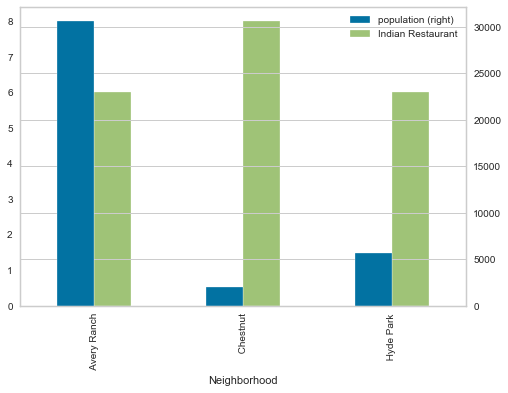

In cluster 2 there is 1 restaurant per 1916 people


In [102]:
temp = tn_count_f[tn_count_f['labels']==2][['Neighborhood','population','Indian Restaurant']].set_index('Neighborhood')
temp.plot( kind= 'bar',secondary_y= 'population', rot= 90 )
plt.show()

pop = tn_count_f[tn_count_f['labels']==2][['population']].sum()
res = tn_count_f[tn_count_f['labels']==2][['Indian Restaurant']].sum()
avg = int(pop)/int(res)
print ('In cluster 2 there is 1 restaurant per %d people' %(avg))

## Cluster 3

In [48]:
tn_count_f[tn_count_f['labels']==3][['Neighborhood','population','Indian Restaurant']]

,Neighborhood,population,Indian Restaurant
25,Garrison Park,14429,3
35,Highpointe,1577,2
58,Riverside,13544,5
69,Sweetbriar,7534,15


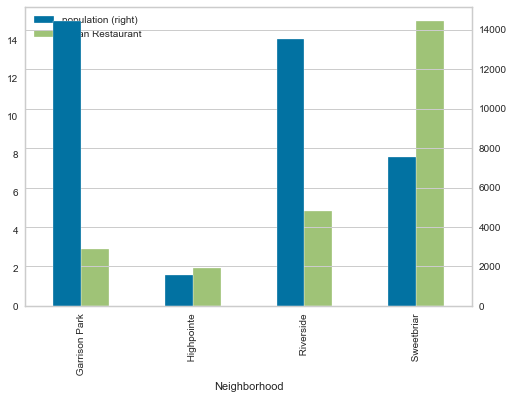

In cluster 3 there is 1 restaurant per 1483 people


In [105]:
temp = tn_count_f[tn_count_f['labels']==3][['Neighborhood','population','Indian Restaurant']].set_index('Neighborhood')
temp.plot( kind= 'bar',secondary_y= 'population', rot= 90 )
plt.show()

pop = tn_count_f[tn_count_f['labels']==3][['population']].sum()
res = tn_count_f[tn_count_f['labels']==3][['Indian Restaurant']].sum()
avg = int(pop)/int(res)
print ('In cluster 3 there is 1 restaurant per %d people' %(avg))

## Cluster 4

In [49]:
tn_count_f[tn_count_f['labels']==4][['Neighborhood','population','Indian Restaurant']]

,Neighborhood,population,Indian Restaurant
5,Balcones Woods,43298,29
6,Barton Hills,10917,28
8,Bouldin Creek,5644,28
11,Canyon Creek,14045,10
14,Cherry Creek,12231,13
17,Copperfield,3810,26
22,East Oak Hill,21430,3
23,Franklin Park,20906,6
28,Gracy Woods,8427,28
30,Great Hills,43298,24


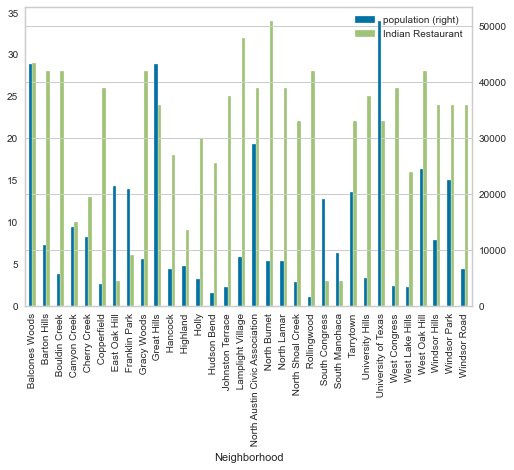

In cluster 4 there is 1 restaurant per 664 people


In [106]:
temp = tn_count_f[tn_count_f['labels']==4][['Neighborhood','population','Indian Restaurant']].set_index('Neighborhood')
temp.plot( kind= 'bar',secondary_y= 'population', rot= 90 )
plt.show()

pop = tn_count_f[tn_count_f['labels']==4][['population']].sum()
res = tn_count_f[tn_count_f['labels']==4][['Indian Restaurant']].sum()
avg = int(pop)/int(res)
print ('In cluster 4 there is 1 restaurant per %d people' %(avg))

## Cluster 5

In [50]:
tn_count_f[tn_count_f['labels']==5][['Neighborhood','population','Indian Restaurant']]

,Neighborhood,population,Indian Restaurant
1,Anderson Mill,8953,12
7,Battle Bend Springs,7139,12
12,Cat Mountain,1759,5
16,Circle C Ranch,15197,8
34,Highland Park West Balcones,3146,11
39,Jester Estates,23548,10
42,Lost Creek,1099,9
50,North Loop,8279,25
52,Northwest Hills,18351,4
54,Old West Austin,7401,16


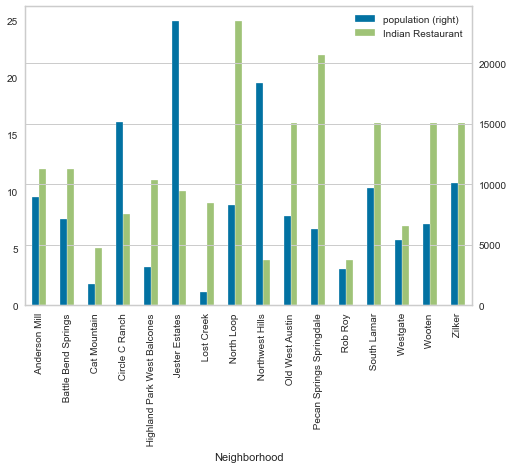

In cluster 5 there is 1 restaurant per 705 people


In [107]:
temp = tn_count_f[tn_count_f['labels']==5][['Neighborhood','population','Indian Restaurant']].set_index('Neighborhood')
temp.plot( kind= 'bar',secondary_y= 'population', rot= 90 )
plt.show()


pop = tn_count_f[tn_count_f['labels']==5][['population']].sum()
res = tn_count_f[tn_count_f['labels']==5][['Indian Restaurant']].sum()
avg = int(pop)/int(res)
print ('In cluster 5 there is 1 restaurant per %d people' %(avg))

## Results and discussion: 
From our preliminary exploration, we found that only 3.7% of all of 1000+ restaurants (bars were excluded in this search) in Austin are Indian, Chinese or Asian. This leaves much scope to open a restaurant of these types in a bustling city with a diverse population. Our analysis shows that even though there is a larger number of restaurants in the center of Austin as opposed to other parts, some of the final recommended neighborhood centers are within the constraints of being 300m away from any Indian, Asian or Chinese restaurant, and 500m away from any other restaurant. The parameter K clusters for K-Means were chosen based on the Elbow method (naïve method) and Silhouette score and K was chosen to be 5. 7 neighborhoods were chosen based on population constraint and restaurant per population. As according to all the clusters almost 1 restaurant is assigned to 500 people. Given the population of the indian people The neighborhoods recommended are:

Garrison Park

Highpointe

Riverside

Avery Ranch

Martin Luther King

## Conclusion and Next steps:

As far as openening a restaurant there are various other factors that needs to be incorporated.For the next steps in the project  and to improve the location prefrence we can do some research on the following topics and implement them for improving the location prefrences. Also final decision on optimal restaurant location will be made by stakeholders based on specific characteristics of neighborhoods and locations in every recommended zone, taking into consideration additional factors like


Type of Neighborhood (rich or poor),
Average income of people,
Crime rates,
Standard of people living in the neighborhood,
Type of indian population (South Indian, North Indian, Maharashtrian, etc),
real estate availability,
noise / proximity to major roads,
social and economic,
Nearby community places (Malls, Theatre, etc.).




